In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout, \
                                    Conv2D, Conv2DTranspose, MaxPooling2D, GlobalMaxPool2D, \
                                    concatenate, add
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.data import Dataset

In [2]:
# !pip install -q ../input/segmentationmodels/segmentation_models-1.0.1-py3-none-any.whl

In [3]:
!ls ../input/segmentationmodels/

Keras_Applications-1.0.8-py3-none-any.whl
efficientnet-1.0.0-py3-none-any.whl
image_classifiers-1.0.0-py3-none-any.whl
segmentation_models-1.0.1-py3-none-any.whl


In [4]:
!pip install -q ../input/segmentationmodels/Keras_Applications-1.0.8-py3-none-any.whl
!pip install -q ../input/segmentationmodels/efficientnet-1.0.0-py3-none-any.whl
!pip install -q ../input/segmentationmodels/image_classifiers-1.0.0-py3-none-any.whl
!pip install -q ../input/segmentationmodels/segmentation_models-1.0.1-py3-none-any.whl

In [5]:
# !pip install segmentation-models

In [6]:
# !mkdir wheels

In [7]:
# !cp /root/.cache/pip/wheels/42/ff/d5/b7d6497855f0bd37b77086965c3f806fa2b81d833c7207d67c/* /kaggle/working/wheels

In [8]:
# !ls wheels/

In [9]:
# /root/.cache/pip/wheels/42/ff/d5/b7d6497855f0bd37b77086965c3f806fa2b81d833c7207d67c

In [10]:
import segmentation_models as sm

Segmentation Models: using `keras` framework.


# Looking into data

In [11]:
BASE_DIR = os.path.join('..', 'input', 'sartorius-cell-instance-segmentation')

print('\tInput data folder structure', *os.listdir(BASE_DIR), sep='\n')

TRAIN_IMG_DIR = os.path.join(BASE_DIR, 'train')
TRAIN_FILE = os.path.join(BASE_DIR, 'train.csv')

	Input data folder structure
LIVECell_dataset_2021
sample_submission.csv
train_semi_supervised
train.csv
test
train


In [12]:
IMAGE_SHAPE = (520, 704, 3)

In [13]:
print('Number of train images', len(os.listdir(TRAIN_IMG_DIR)))

Number of train images 606


In [14]:
df_train = pd.read_csv(TRAIN_FILE)
df_train.head()

,id,annotation,width,height,cell_type,plate_time,sample_date,sample_id,elapsed_timedelta
0,0030fd0e6378,118145 6 118849 7 119553 8 120257 8 120961 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
1,0030fd0e6378,189036 1 189739 3 190441 6 191144 7 191848 8 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
2,0030fd0e6378,173567 3 174270 5 174974 5 175678 6 176382 7 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
3,0030fd0e6378,196723 4 197427 6 198130 7 198834 8 199538 8 2...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00
4,0030fd0e6378,167818 3 168522 5 169225 7 169928 8 170632 9 1...,704,520,shsy5y,11h30m00s,2019-06-16,shsy5y[diff]_E10-4_Vessel-714_Ph_3,0 days 11:30:00


In [15]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73585 entries, 0 to 73584
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 73585 non-null  object
 1   annotation         73585 non-null  object
 2   width              73585 non-null  int64 
 3   height             73585 non-null  int64 
 4   cell_type          73585 non-null  object
 5   plate_time         73585 non-null  object
 6   sample_date        73585 non-null  object
 7   sample_id          73585 non-null  object
 8   elapsed_timedelta  73585 non-null  object
dtypes: int64(2), object(7)
memory usage: 5.1+ MB


In [16]:
df_train.nunique()

id                     606
annotation           73470
width                    1
height                   1
cell_type                3
plate_time               8
sample_date             18
sample_id              403
elapsed_timedelta        8
dtype: int64

In [17]:
def load_img(img_id, dir_=TRAIN_IMG_DIR):
    file_name = f'{img_id}.png'
    img_path = os.path.join(dir_, file_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255
    return img


def plot_img(img, ax=None, **plot_kw):
    if ax is None:
        fig, ax = plt.subplots(figsize=(10,10))
    vmin = 0
    vmax = 1 if img.max() <= 1 else 255
    
    ax.imshow(img, interpolation='none', vmin=vmin, vmax=vmax, **plot_kw)
    ax.axis('off')

In [18]:
# https://www.kaggle.com/paulorzp/run-length-encode-and-decode

def rle_encode(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels = img.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)


def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
    for lo, hi in zip(starts, ends):
        img[lo : hi] = color
    return img.reshape(shape)
    

def build_masks(df, image_id, input_shape, colors=True):
    height, width = input_shape
    labels = df[df["id"] == image_id]["annotation"].tolist()
    if colors:
        mask = np.zeros((height, width, 3))
        for label in labels:
            mask += rle_decode(label, shape=(height,width , 3), color=np.random.rand(3))
    else:
        mask = np.zeros((height, width, 1))
        for label in labels:
            mask += rle_decode(label, shape=(height, width, 1))
            
    if not colors and (mask > 1).any():
        print(f'There are {(mask > 1).sum()} overlaping pixels in {image_id}')
    print(f'There are {len(labels)} instances in {image_id}')
        
    mask = mask.clip(0, 1)
    return mask

In [19]:
def plot_img_and_mask(df, img_id, dir_=TRAIN_IMG_DIR):
    img = load_img(img_id, dir_=dir_)

    df_img = df[df['id'] == img_id]
    img_mask_bin = build_masks(df, img_id, input_shape=IMAGE_SHAPE[:2], colors=False)
    img_mask_color = build_masks(df, img_id, input_shape=IMAGE_SHAPE[:2])

    fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(30, 10), gridspec_kw={'wspace': 0.05})
    plot_img(img, ax=ax1)

    plot_img(img_mask_bin, ax=ax2, cmap='gray')
    plot_img(img_mask_color, ax=ax3)

    if 'cell_type' in df_img.columns:
        cell_type = df_img['cell_type'].iloc[0]
        fig.suptitle(f'Cell type: {cell_type}', y=0.81, size=20)

There are 359 overlaping pixels in fe3e30f849f4
There are 360 instances in fe3e30f849f4
There are 360 instances in fe3e30f849f4
There are 82 overlaping pixels in ffdb3cc02eef
There are 77 instances in ffdb3cc02eef
There are 77 instances in ffdb3cc02eef
There are 2349 overlaping pixels in 0140b3c8f445
There are 108 instances in 0140b3c8f445
There are 108 instances in 0140b3c8f445


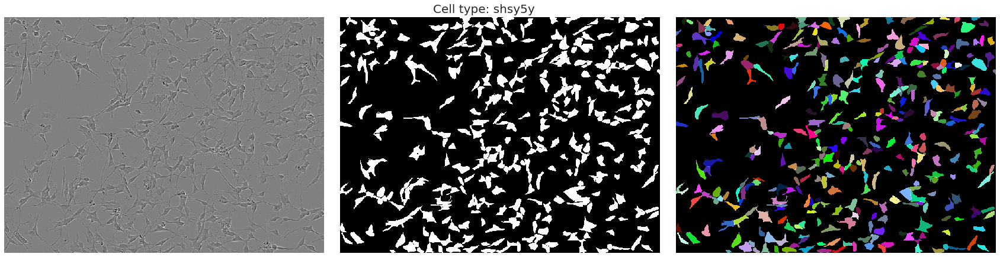

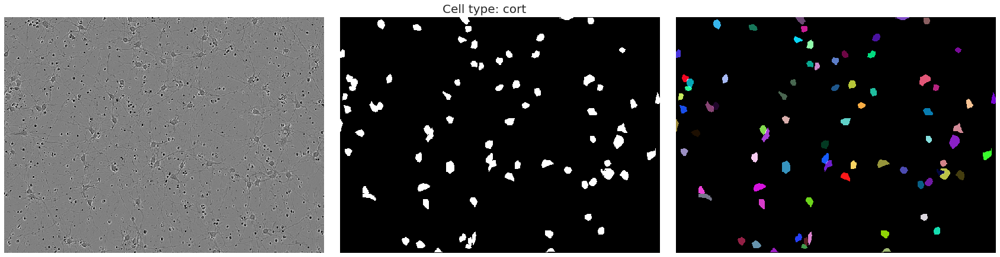

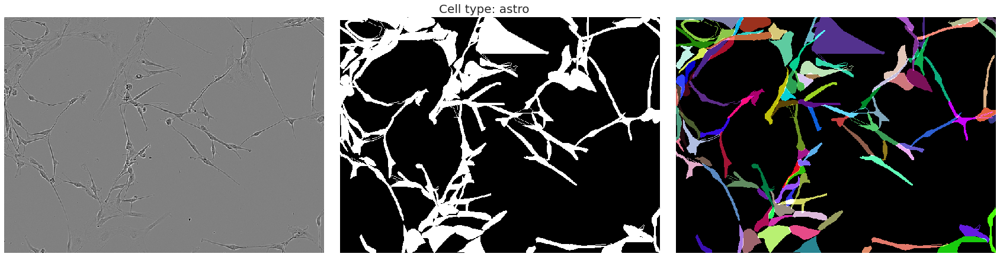

In [20]:
plot_img_and_mask(df_train, 'fe3e30f849f4')
plot_img_and_mask(df_train, 'ffdb3cc02eef')
plot_img_and_mask(df_train, '0140b3c8f445')

There are 2349 overlaping pixels in 0140b3c8f445
There are 108 instances in 0140b3c8f445
There are 108 instances in 0140b3c8f445


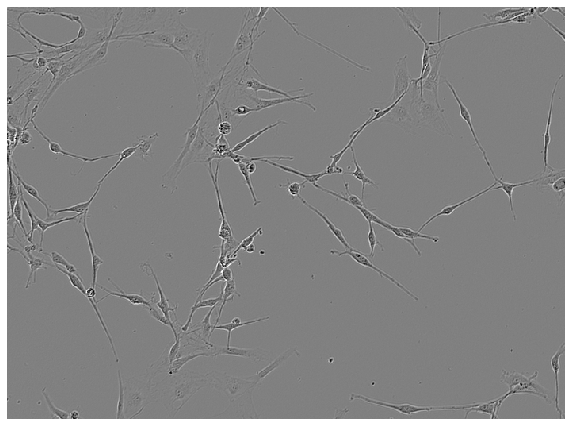

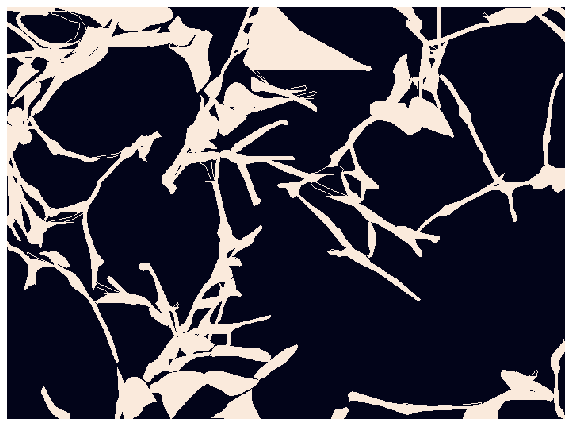

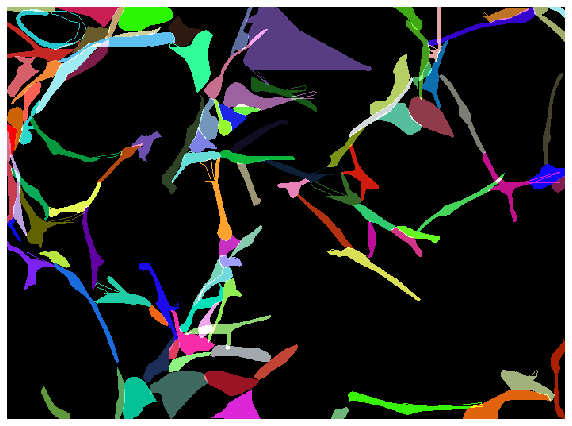

In [21]:
img_id = '0140b3c8f445'

img = load_img(img_id, dir_=TRAIN_IMG_DIR)

img_mask_bin = build_masks(df_train, img_id, input_shape=IMAGE_SHAPE[:2], colors=False)
img_mask_color = build_masks(df_train, img_id, input_shape=IMAGE_SHAPE[:2])

plot_img(img)
plot_img(img_mask_bin)
plot_img(img_mask_color)

   label    area  equivalent_diameter  mean_intensity  solidity
0     10  289064           606.669363        0.037168  0.795255
1     11   11600           121.530156        0.983017  0.388168
2     12       1             1.128379        1.000000  1.000000
3     13    6825            93.219418        0.998095  0.816388
4     14    3089            62.713930        0.986080  0.183465


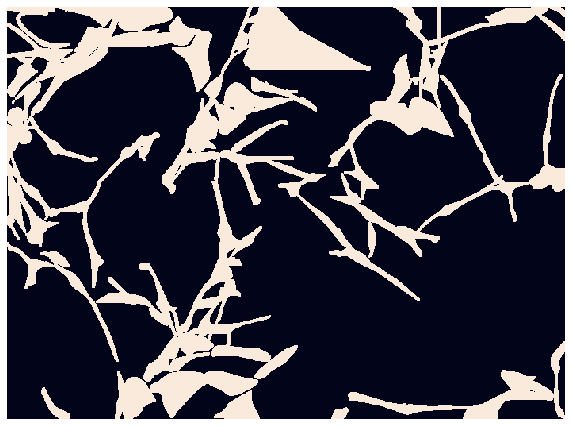

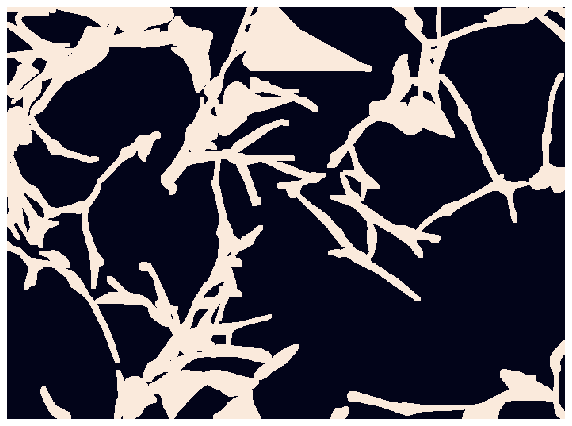

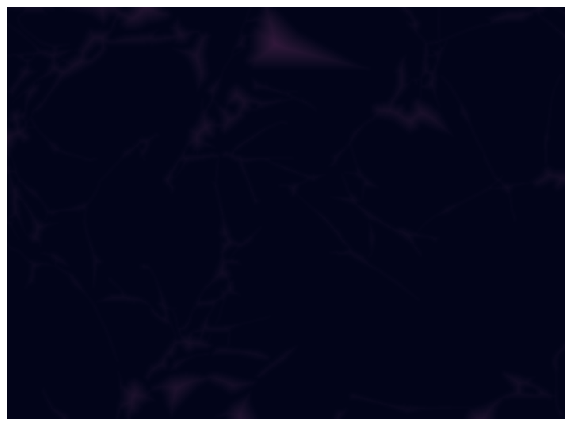

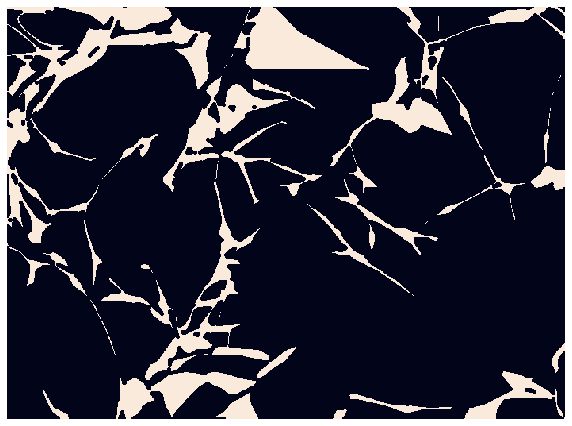

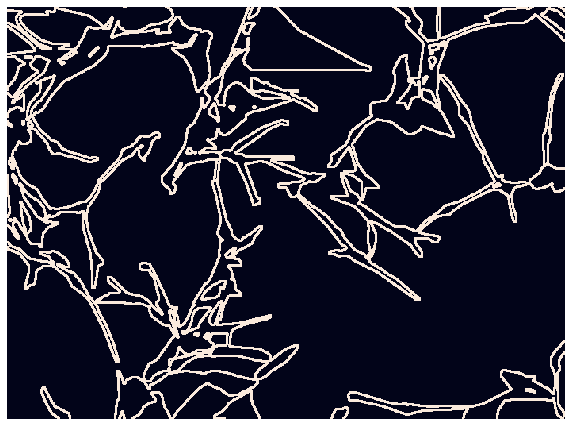

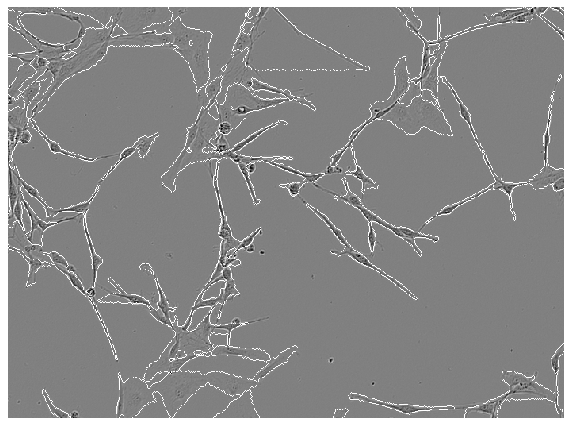

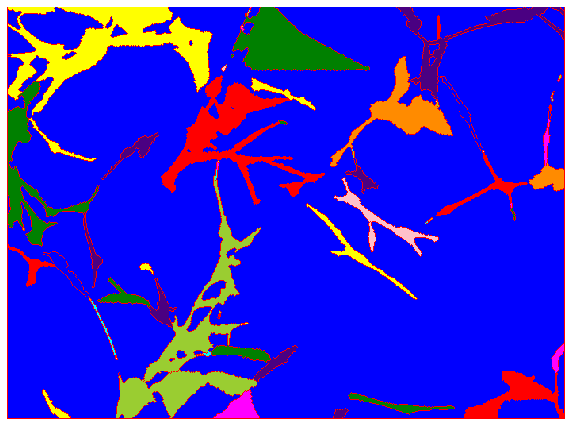

In [22]:
from skimage import measure, color, io

img = (img*255).astype('uint8')

img_grey = img_mask_bin[:,:,0].astype("uint8")

## transform the unet result to binary image
#Threshold image to binary using OTSU. ALl thresholded pixels will be set to 255
ret1, thresh = cv2.threshold(img_grey, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)


# Morphological operations to remove small noise - opening
#To remove holes we can use closing
kernel = np.ones((3,3),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)

plot_img(opening)

#from skimage.segmentation import clear_border
#opening = clear_border(opening) #Remove edge touching grains. 
#Check the total regions found before and after applying this. 

#Now we know that the regions at the center of cells is for sure cells
#The region far away is background.
#We need to extract sure regions. For that we can use erode. 
#But we have cells touching, so erode alone will not work. 
#To separate touching objects, the best approach would be distance transform and then thresholding.

# let us start by identifying sure background area
# dilating pixes a few times increases cell boundary to background. 
# This way whatever is remaining for sure will be background. 
#The area in between sure background and foreground is our ambiguous area. 
#Watershed should find this area for us. 
sure_bg = cv2.dilate(opening,kernel,iterations=1)
plot_img(sure_bg)

# Finding sure foreground area using distance transform and thresholding
#intensities of the points inside the foreground regions are changed to 
#distance their respective distances from the closest 0 value (boundary).
#https://www.tutorialspoint.com/opencv/opencv_distance_transformation.htm
dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
plot_img(dist_transform)

#Let us threshold the dist transform by starting at 1/2 its max value.
ret2, sure_fg = cv2.threshold(dist_transform, 0.07*dist_transform.max(),255,0)

#Later you may realize that 0.2*max value may be better. Also try other values. 
#High value like 0.7 will drop some small mitochondria. 

# Unknown ambiguous region is nothing but bkground - foreground
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
plot_img(sure_fg)
plot_img(unknown)


#Now we create a marker and label the regions inside. 
# For sure regions, both foreground and background will be labeled with positive numbers.
# Unknown regions will be labeled 0. 
#For markers let us use ConnectedComponents. 
ret3, markers = cv2.connectedComponents(sure_fg)

#One problem rightnow is that the entire background pixels is given value 0.
#This means watershed considers this region as unknown.
#So let us add 10 to all labels so that sure background is not 0, but 10
markers = markers+10

# Now, mark the region of unknown with zero
markers[unknown==255] = 0
#plt.imshow(markers, cmap='gray')   #Look at the 3 distinct regions.

#Now we are ready for watershed filling. 
markers = cv2.watershed(img, markers)
#plt.imshow(markers, cmap='gray')
#The boundary region will be marked -1
#https://docs.opencv.org/3.3.1/d7/d1b/group__imgproc__misc.html#ga3267243e4d3f95165d55a618c65ac6e1

#Let us color boundaries in yellow. 
img[markers == -1] = [255,255,255]  

img2 = color.label2rgb(markers, bg_label=0)

plot_img(img)
plot_img(img2)

#Now, time to extract properties of detected cells
# regionprops function in skimage measure module calculates useful parameters for each object.


props = measure.regionprops_table(markers, intensity_image=img_grey, 
                              properties=['label',
                                          'area', 'equivalent_diameter',
                                          'mean_intensity', 'solidity'])
    
import pandas as pd
df = pd.DataFrame(props)
# df = df[df.mean_intensity > 100]  #Remove background or other regions that may be counted as objects

print(df.head())

# TF data pipeline

In [23]:
INPUT_SHAPE = (512, 512, 3)

In [24]:
MY_BASE_DIR = os.path.join('..', 'input', 'sartorious-dataset-preprocessed')

MY_TRAIN_DIR = os.path.join(MY_BASE_DIR, 'train')
MY_VALID_DIR = os.path.join(MY_BASE_DIR, 'valid')

MY_TRAIN_IMG_DIR = os.path.join(MY_TRAIN_DIR, 'images')
MY_TRAIN_MASK_DIR = os.path.join(MY_TRAIN_DIR, 'masks')
MY_VALID_IMG_DIR = os.path.join(MY_VALID_DIR, 'images')
MY_VALID_MASK_DIR = os.path.join(MY_VALID_DIR, 'masks')

In [25]:
DS_KWS = dict(
    labels=None,
    shuffle=False,
    image_size=INPUT_SHAPE[:2], ###
)
BATCH_SIZE = 8
SHUFFLE_BUFFER = 100
AUTO = tf.data.experimental.AUTOTUNE

import albumentations as A

transform = A.Compose([
#     A.Resize(*CFG.img_size),
    #         A.Normalize(
    #                 mean=[0.485, 0.456, 0.406], 
    #                 std=[0.229, 0.224, 0.225], 
    #                 max_pixel_value=255.0, 
    #                 p=1.0,
    #             ),
    A.CLAHE(p=0.35),
    A.ColorJitter(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=90, p=0.5),
    A.OneOf([
        A.GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
    #             A.OpticalDistortion(distort_limit=0.05, shift_limit=0.05, p=1.0),
        A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1.0)
    ], p=0.25),
    A.CoarseDropout(max_holes=8, max_height=INPUT_SHAPE[0]//20, max_width=INPUT_SHAPE[1]//20,
                     min_holes=5, fill_value=0, mask_fill_value=0, p=0.5),
    A.Rotate(always_apply=False, p=1.0, limit=(-90, 90))
    
], p=1.0)


def aug_fn(image, mask):
    image = image.astype('uint8')
    mask = mask.astype('uint8') 

    transformed = transform(image=image, mask=mask)
    
    image = tf.cast(transformed['image'], tf.float32)
    mask = tf.cast(transformed['mask'], tf.float32)
    
    return image, mask


def set_shapes(img, label):
    img.set_shape([*INPUT_SHAPE[:2], 3])
    label.set_shape([*INPUT_SHAPE[:2], 3])
    return img, label


def augmentation(image, mask):
    image, mask = tf.numpy_function(func=aug_fn, inp=[image, mask], Tout=[tf.float32, tf.float32])
    return image, mask


def create_tf_dataset(img_dir, mask_dir, augment=False):
    def preprocess(image, mask):
#         print(img.shape)
        image = image / 255
        mask = mask / 255
#         img = tf.image.resize(img, INPUT_SHAPE[:2], method='nearest')
        return image, mask
                              
    images_ds = image_dataset_from_directory(img_dir, **DS_KWS).unbatch()
#     images_ds = images_ds.map(preprocess, num_parallel_calls=AUTO)

#     masks_ds = image_dataset_from_directory(mask_dir, color_mode='grayscale', **DS_KWS).unbatch()
    masks_ds = image_dataset_from_directory(mask_dir, **DS_KWS).unbatch()
#     masks_ds = masks_ds.map(lambda imgs: imgs[:,:,1:], num_parallel_calls=AUTO)
#     masks_ds = masks_ds.map(preprocess, num_parallel_calls=AUTO)

    ds = Dataset.zip((images_ds, masks_ds))
    if augment:
        ds = ds.map(augmentation, num_parallel_calls=AUTO).map(set_shapes, num_parallel_calls=AUTO)
    ds = ds.map(preprocess, num_parallel_calls=AUTO)
    ds = ds.shuffle(SHUFFLE_BUFFER).batch(BATCH_SIZE).prefetch(AUTO)

    return ds


train_ds = create_tf_dataset(MY_TRAIN_IMG_DIR, MY_TRAIN_MASK_DIR, augment=True)
valid_ds = create_tf_dataset(MY_VALID_IMG_DIR, MY_VALID_MASK_DIR, augment=False)

Found 484 files belonging to 1 classes.


2021-12-26 21:20:59.904989: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-26 21:21:00.008194: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-26 21:21:00.009008: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-26 21:21:00.011574: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Found 484 files belonging to 1 classes.
Found 122 files belonging to 1 classes.
Found 122 files belonging to 1 classes.


In [26]:
# visualize data loaded via tf.data API to chech that img<->mask mapping is valid

CELL_COLOR = [173/255, 255/255, 47/255, 0.4]
BACKGROUND_COLOR = [0, 0, 0, 0]


def decode_tf_data(ds):
    """
    return 1 batch of images and masks as numpy arrays
    """
    return next(ds.take(1).as_numpy_iterator()) 


def mask1d_to_mask4d(mask, color=CELL_COLOR):
    """
    convert grayscale mask to RGBA and set full transparency of background
    """
    mask4d = np.zeros([*mask.shape[:2], 4])
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if mask[i, j, 0] == 1:
                mask4d[i, j] = np.array(color)
            else:
                mask4d[i, j] = np.array(BACKGROUND_COLOR)
    return mask4d


def tf_plot_img_and_mask(images, masks):
    for image, mask in zip(images, masks):
        mask4d = mask1d_to_mask4d(mask[:,:,[2]])
        cont4d = mask1d_to_mask4d(mask[:,:,[1]], color=[1,0,0,0.4])

        fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 10), gridspec_kw={'wspace': 0.05})
        
        plot_img(image, ax=ax1)
        
        plot_img(mask4d, ax=ax2)      
        plot_img(cont4d, ax=ax2)   
        
        plot_img(image, ax=ax3, cmap='gray')
        plot_img(mask4d, ax=ax3)      
        plot_img(cont4d, ax=ax3)      

In [27]:
x = decode_tf_data(valid_ds)[1][0]

2021-12-26 21:21:03.250885: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [28]:
np.unique(x[...,2])

array([0., 1.], dtype=float32)

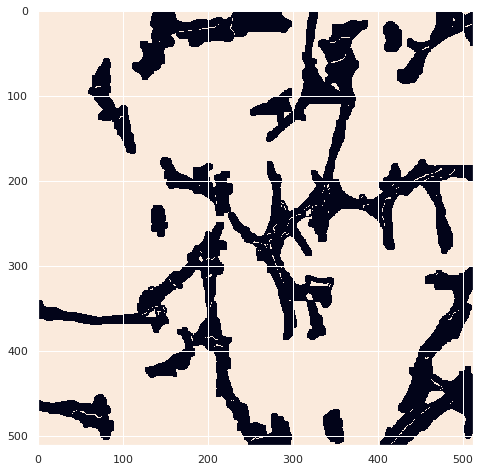

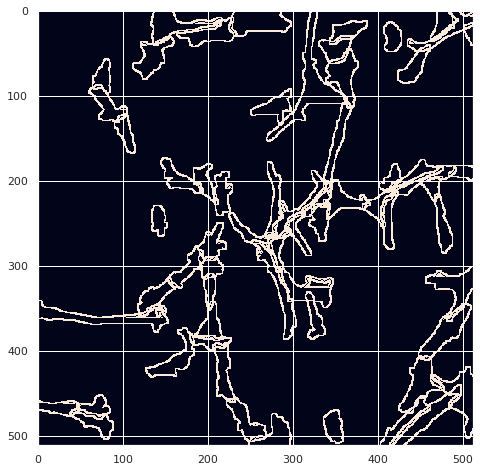

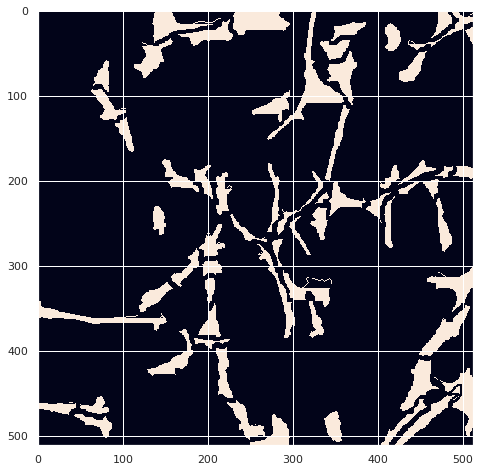

In [29]:
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(x[...,0], interpolation='none', vmin=0, vmax=1)
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(x[...,1], interpolation='none', vmin=0, vmax=1)
fig, ax = plt.subplots(figsize=(8,8))
plt.imshow(x[...,2], interpolation='none', vmin=0, vmax=1)


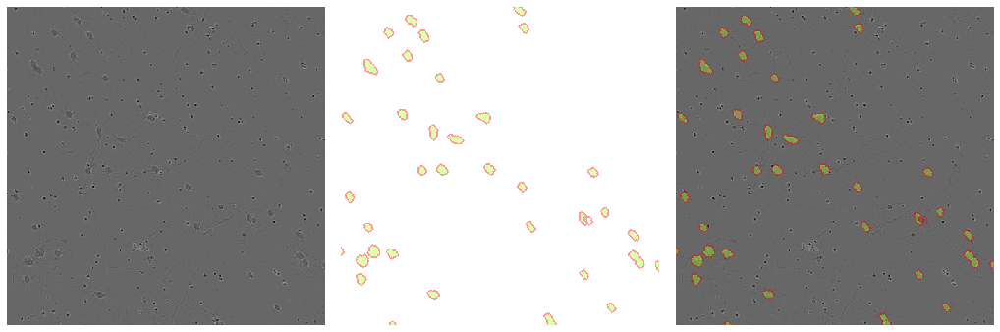

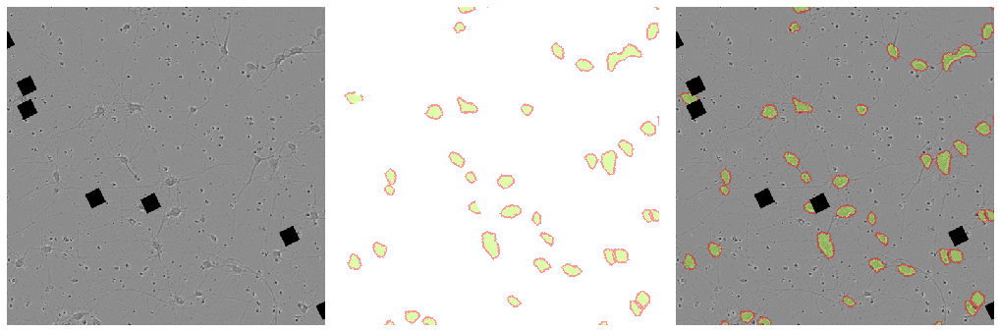

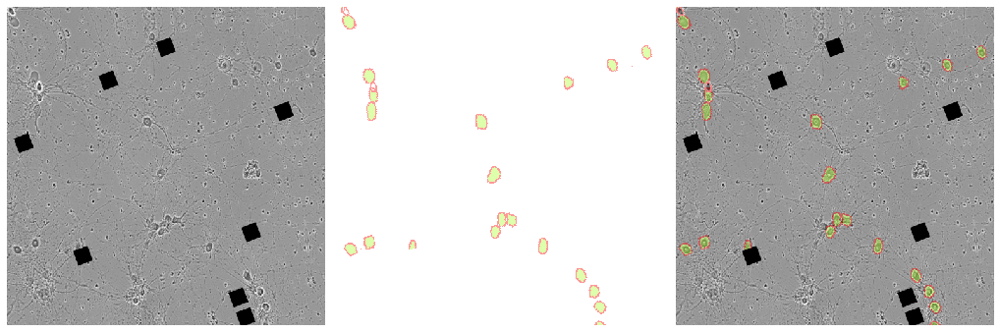

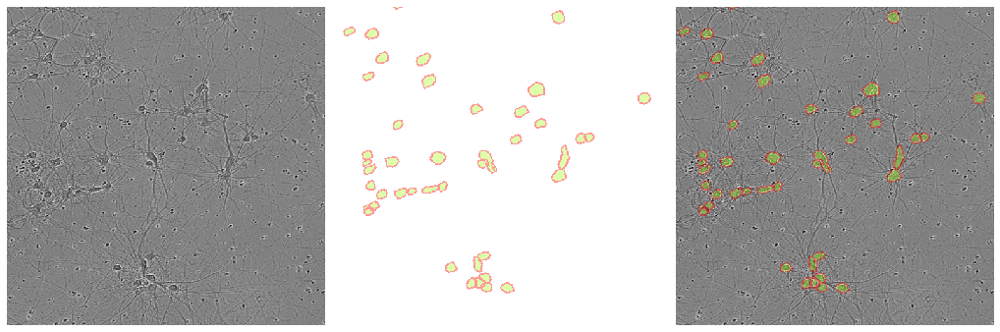

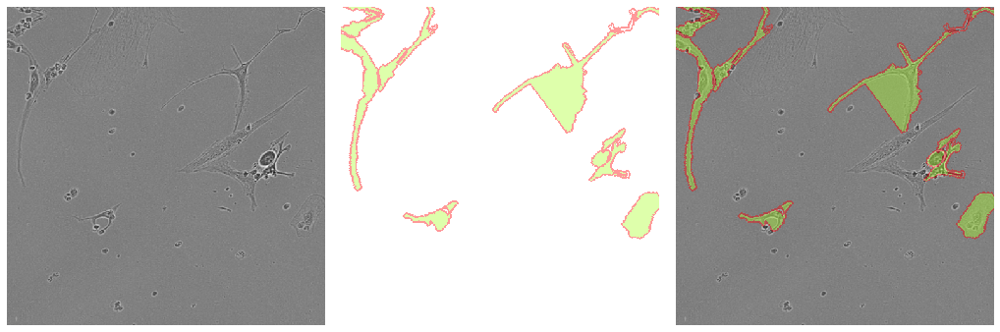

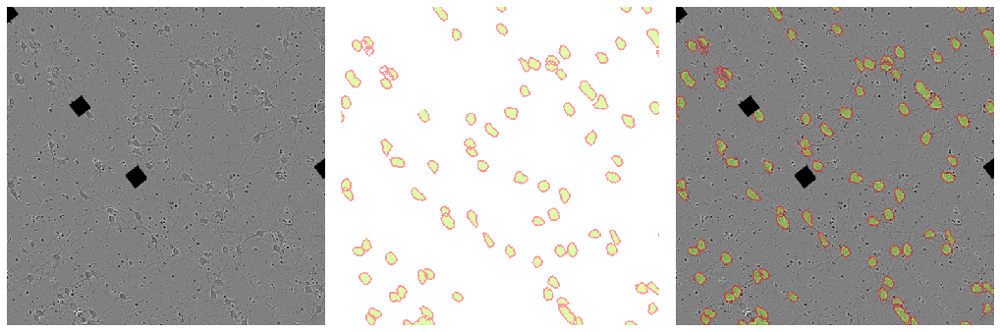

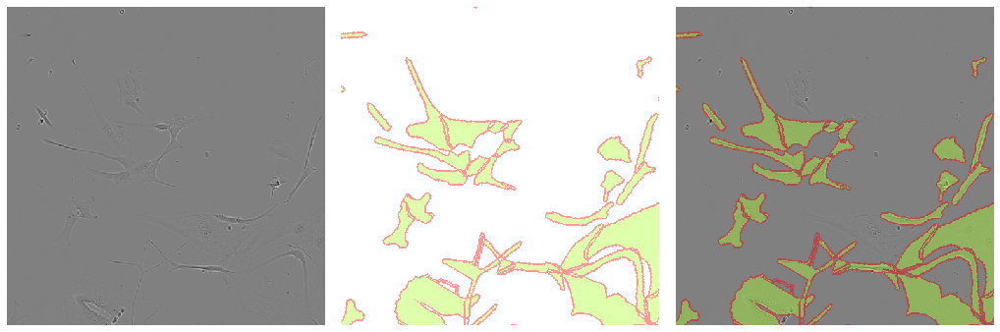

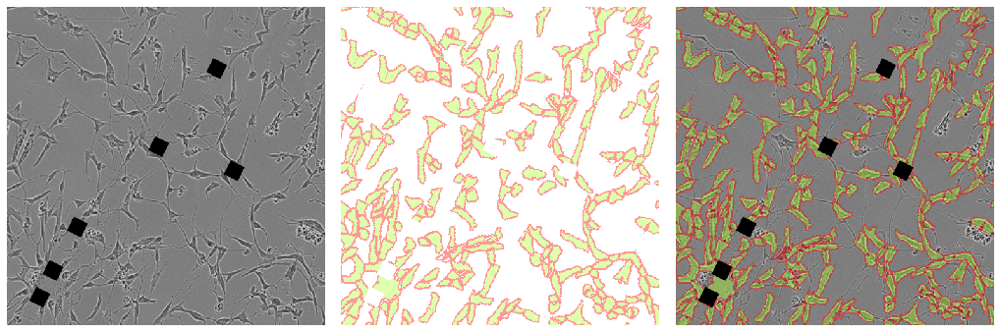

In [30]:
tf_plot_img_and_mask(*decode_tf_data(train_ds))

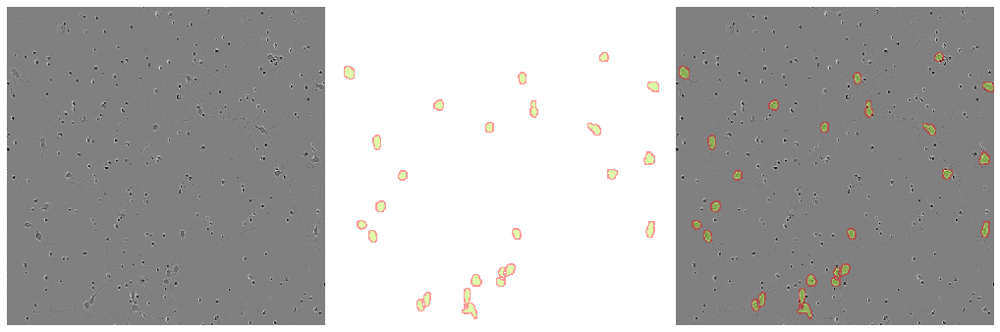

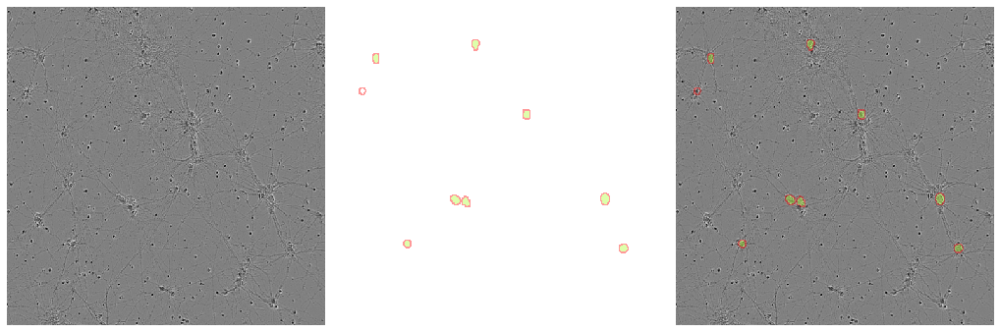

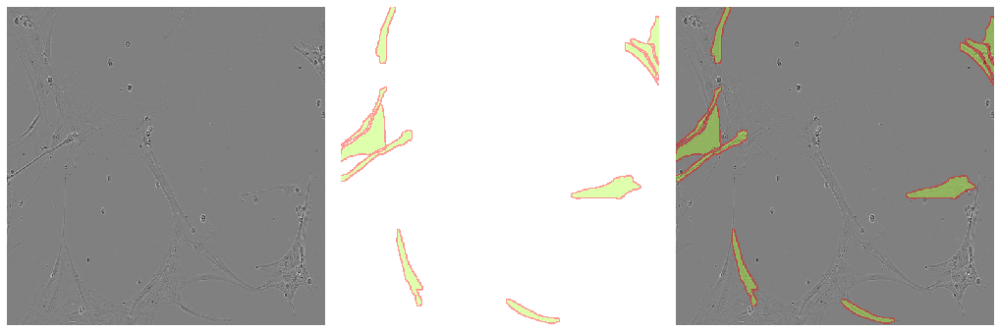

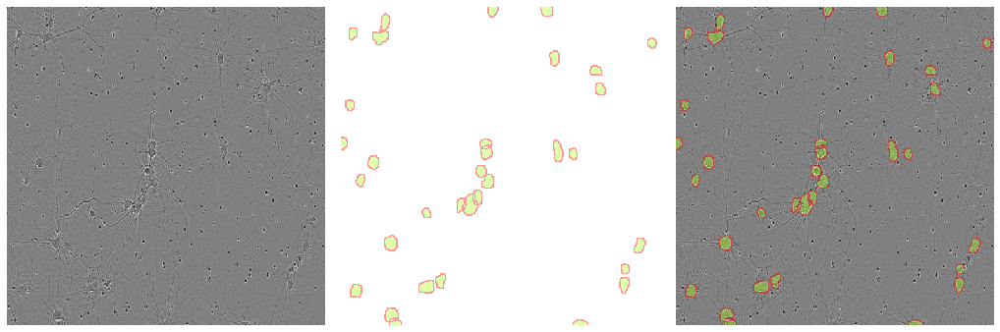

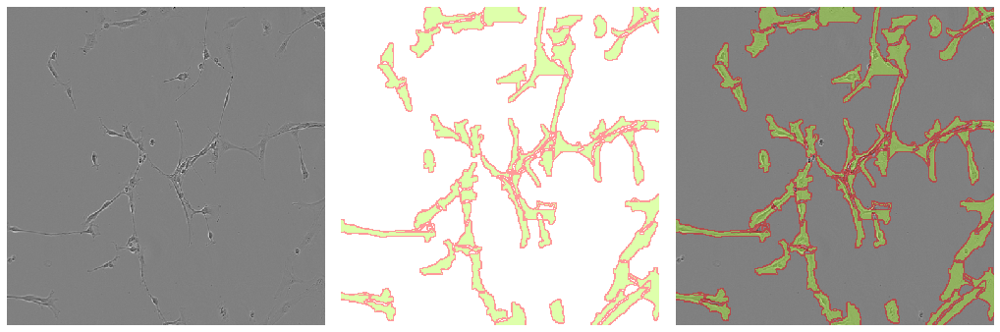

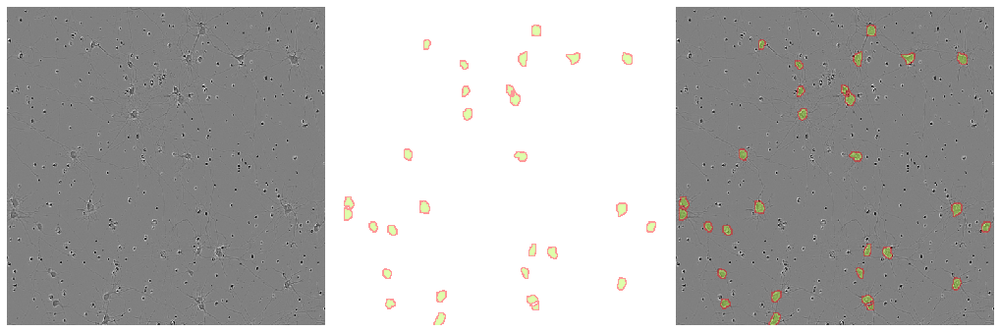

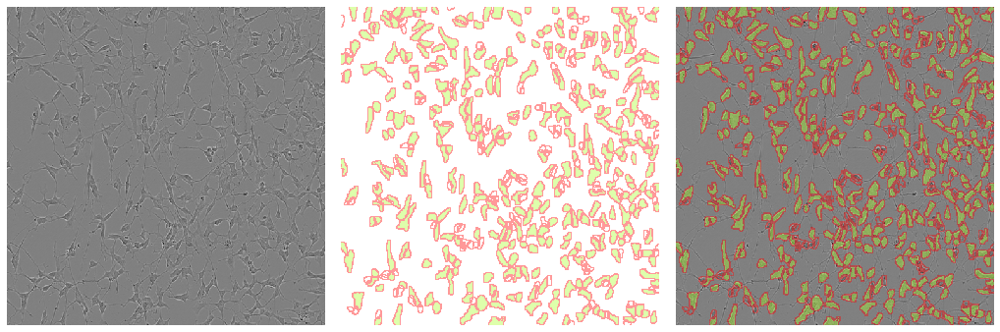

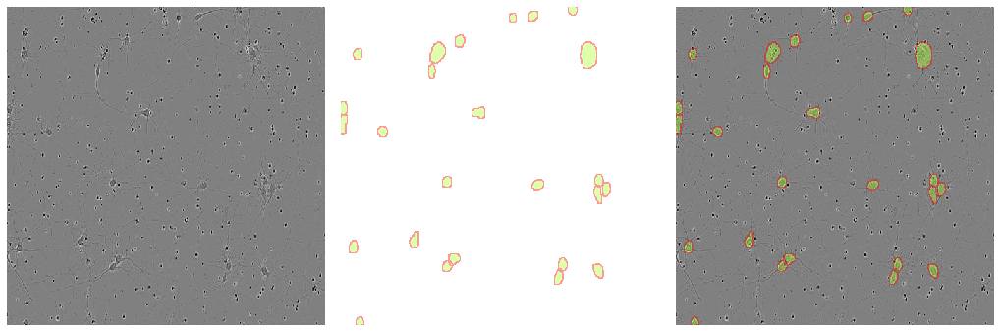

In [31]:
tf_plot_img_and_mask(*decode_tf_data(valid_ds))

# Modeling

In [32]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x


def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(3, (1, 1), activation='softmax')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [33]:
# def iou(label):
#     def _iou(y_true, y_pred):
#         nonlocal label
#         def f(y_true, y_pred):

#             intersection = (y_true * y_pred).sum()
#             union = y_true.sum() + y_pred.sum() - intersection
#             x = (intersection + 1e-15) / (union + 1e-15)
#             x = x.astype(np.float32)
#             print(f'iou{label}', x)
#             return x
#         return tf.numpy_function(f, [y_true[...,label], y_pred[...,label]], tf.float32)
#     _iou.__name__ = f'IoU({label})'
#     return _iou

# def iou_(y_true, y_pred):
#     def f(y_true, y_pred):
#         intersection = (y_true * y_pred).sum()
#         union = y_true.sum() + y_pred.sum() - intersection
#         x = (intersection + 1e-15) / (union + 1e-15)
#         x = x.astype(np.float32)
#         print('iou', x)
#         return x
#     return tf.numpy_function(f, [y_true, y_pred], tf.float32)

# def dice_loss(y_true, y_pred):
#     smooth = 1.
#     y_true_f = K.flatten(y_true)
#     y_pred_f = K.flatten(y_pred)
#     intersection = y_true_f * y_pred_f
#     score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
#     return 1. - score

# def bce_dice_loss(y_true, y_pred):
#     def _bce_dice_loss(y_true, y_pred):
#         return binary_crossentropy(tf.cast(y_true, tf.float32), y_pred, axis=[1,2]) + 0.5 * dice_loss(tf.cast(y_true, tf.float32), y_pred)
    
#     print(binary_crossentropy(tf.cast(y_true, tf.float32), y_pred, axis=-1))
#     return binary_crossentropy(tf.cast(y_true, tf.float32), y_pred, axis=-1)

#     print('loss', K.mean(_bce_dice_loss(y_true[...,0], y_pred[...,0]) + 0.25 * _bce_dice_loss(y_true[...,1], y_pred[...,1])))
#     return K.mean(_bce_dice_loss(y_true[...,0], y_pred[...,0]) + 0.25 * _bce_dice_loss(y_true[...,1], y_pred[...,1]))
# # def bce_dice_loss(y_true, y_pred):
# #     print(binary_crossentropy(tf.cast(y_true, tf.float32), y_pred))
# #     print()
# #     x =  tf.keras.losses.binary_crossentropy(y_true, y_pred, axis=[1, 2])
# #     print(x)
# #     return x
# #     return binary_crossentropy(tf.cast(y_true, tf.float32), y_pred) + 0.5 * dice_loss(tf.cast(y_true, tf.float32), y_pred)

In [34]:
# config={ 
#      "learning_rate": 1e-4,
#      "epochs": 100,
# #      "batch_size": 4,
#      "loss_function": "bce_dice_loss",
#      "architecture": "attention based residual Unet",
#      "dataset": "sartorius:brain cell i/s"
# }
learning_rate = 1e-4
epochs = 50

WEIGHTS_FILE = "./model_unet.h5"
model_checkpoint = ModelCheckpoint(
    WEIGHTS_FILE,
    save_best_only=True,
    save_weights_only=True,
)
   

input_tensor = Input(INPUT_SHAPE)
unet_model = get_unet(input_tensor)

opt = tf.keras.optimizers.Adam(learning_rate)
metrics = ["acc", sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

unet_model.compile(loss=sm.losses.CategoricalCELoss(), optimizer=opt, metrics=metrics)

# Training

In [35]:
# class CustomCallback(tf.keras.callbacks.Callback):
#     def on_train_batch_end(self, batch, logs=None):
#         keys = list(logs.keys())
#         print()
#         for key, value in logs.items():
#             print(f'callback_{key}: {value}')
        
        
history = unet_model.fit(train_ds, 
                    verbose=1,
                    validation_data=valid_ds, 
                    epochs=epochs,
                    callbacks=[model_checkpoint]) # WandbCallback()

Epoch 1/50


2021-12-26 21:22:42.133188: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


61/61 [==============================] - 62s 732ms/step - loss: 0.3269 - acc: 0.6042 - iou_score: 0.1641 - f1-score: 0.2577 - val_loss: 0.3149 - val_acc: 0.6220 - val_iou_score: 0.1186 - val_f1-score: 0.1759
Epoch 2/50
61/61 [==============================] - 49s 649ms/step - loss: 0.2575 - acc: 0.7635 - iou_score: 0.2281 - f1-score: 0.3054 - val_loss: 0.2558 - val_acc: 0.8246 - val_iou_score: 0.2668 - val_f1-score: 0.2962
Epoch 3/50
61/61 [==============================] - 54s 745ms/step - loss: 0.2307 - acc: 0.8021 - iou_score: 0.2501 - f1-score: 0.3127 - val_loss: 0.2688 - val_acc: 0.8261 - val_iou_score: 0.1811 - val_f1-score: 0.2344
Epoch 4/50
61/61 [==============================] - 50s 691ms/step - loss: 0.2145 - acc: 0.8135 - iou_score: 0.2670 - f1-score: 0.3274 - val_loss: 0.2637 - val_acc: 0.8276 - val_iou_score: 0.2018 - val_f1-score: 0.2511
Epoch 5/50


2021-12-26 21:28:09.979088: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 97 of 100
2021-12-26 21:28:10.023661: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 49s 645ms/step - loss: 0.2014 - acc: 0.8258 - iou_score: 0.2831 - f1-score: 0.3373 - val_loss: 0.2130 - val_acc: 0.8274 - val_iou_score: 0.2596 - val_f1-score: 0.2925
Epoch 6/50
61/61 [==============================] - 49s 648ms/step - loss: 0.1889 - acc: 0.8323 - iou_score: 0.3013 - f1-score: 0.3578 - val_loss: 0.1901 - val_acc: 0.8320 - val_iou_score: 0.2777 - val_f1-score: 0.3117
Epoch 7/50
61/61 [==============================] - 50s 681ms/step - loss: 0.1801 - acc: 0.8386 - iou_score: 0.3102 - f1-score: 0.3651 - val_loss: 0.1612 - val_acc: 0.8418 - val_iou_score: 0.3033 - val_f1-score: 0.3461
Epoch 8/50
61/61 [==============================] - 49s 695ms/step - loss: 0.1718 - acc: 0.8429 - iou_score: 0.3227 - f1-score: 0.3812 - val_loss: 0.1638 - val_acc: 0.8467 - val_iou_score: 0.3175 - val_f1-score: 0.3714
Epoch 9/50
61/61 [==============================] - 51s 687ms/step - loss: 0.1645 - acc: 0.8466 - iou_score: 0.3321 - f1-score: 0.3928 

2021-12-26 21:40:15.828781: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 93 of 100
2021-12-26 21:40:16.705297: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 54s 703ms/step - loss: 0.1402 - acc: 0.8537 - iou_score: 0.3486 - f1-score: 0.4101 - val_loss: 0.1369 - val_acc: 0.8485 - val_iou_score: 0.3140 - val_f1-score: 0.3559
Epoch 16/50


2021-12-26 21:41:10.010963: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 98 of 100
2021-12-26 21:41:10.015301: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 57s 777ms/step - loss: 0.1386 - acc: 0.8545 - iou_score: 0.3543 - f1-score: 0.4188 - val_loss: 0.1356 - val_acc: 0.8530 - val_iou_score: 0.3531 - val_f1-score: 0.4170
Epoch 17/50
61/61 [==============================] - 47s 612ms/step - loss: 0.1356 - acc: 0.8560 - iou_score: 0.3549 - f1-score: 0.4192 - val_loss: 0.1307 - val_acc: 0.8548 - val_iou_score: 0.3403 - val_f1-score: 0.3976
Epoch 18/50
61/61 [==============================] - 53s 700ms/step - loss: 0.1332 - acc: 0.8570 - iou_score: 0.3538 - f1-score: 0.4164 - val_loss: 0.1343 - val_acc: 0.8531 - val_iou_score: 0.3363 - val_f1-score: 0.3894
Epoch 19/50
61/61 [==============================] - 53s 733ms/step - loss: 0.1321 - acc: 0.8579 - iou_score: 0.3598 - f1-score: 0.4260 - val_loss: 0.1339 - val_acc: 0.8537 - val_iou_score: 0.3343 - val_f1-score: 0.3870
Epoch 20/50
61/61 [==============================] - 47s 647ms/step - loss: 0.1322 - acc: 0.8571 - iou_score: 0.3574 - f1-score: 0.4

2021-12-26 21:46:27.653605: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 98 of 100
2021-12-26 21:46:27.663337: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 48s 611ms/step - loss: 0.1312 - acc: 0.8568 - iou_score: 0.3573 - f1-score: 0.4233 - val_loss: 0.1289 - val_acc: 0.8541 - val_iou_score: 0.3380 - val_f1-score: 0.3892
Epoch 22/50


2021-12-26 21:47:49.256920: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 79 of 100
2021-12-26 21:47:51.166372: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 57s 736ms/step - loss: 0.1263 - acc: 0.8597 - iou_score: 0.3675 - f1-score: 0.4370 - val_loss: 0.1292 - val_acc: 0.8557 - val_iou_score: 0.3399 - val_f1-score: 0.3958
Epoch 23/50
61/61 [==============================] - 54s 746ms/step - loss: 0.1252 - acc: 0.8614 - iou_score: 0.3674 - f1-score: 0.4368 - val_loss: 0.1429 - val_acc: 0.8470 - val_iou_score: 0.3234 - val_f1-score: 0.3708
Epoch 24/50
61/61 [==============================] - 51s 660ms/step - loss: 0.1261 - acc: 0.8604 - iou_score: 0.3669 - f1-score: 0.4358 - val_loss: 0.1462 - val_acc: 0.8490 - val_iou_score: 0.3319 - val_f1-score: 0.3848
Epoch 25/50
61/61 [==============================] - 53s 752ms/step - loss: 0.1258 - acc: 0.8601 - iou_score: 0.3684 - f1-score: 0.4390 - val_loss: 0.1494 - val_acc: 0.8451 - val_iou_score: 0.3199 - val_f1-score: 0.3665
Epoch 26/50
61/61 [==============================] - 47s 623ms/step - loss: 0.1244 - acc: 0.8615 - iou_score: 0.3711 - f1-score: 0.4

2021-12-26 21:58:50.202537: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 98 of 100
2021-12-26 21:58:50.915480: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 53s 672ms/step - loss: 0.1161 - acc: 0.8673 - iou_score: 0.3914 - f1-score: 0.4736 - val_loss: 0.1243 - val_acc: 0.8632 - val_iou_score: 0.3712 - val_f1-score: 0.4395
Epoch 33/50


2021-12-26 21:59:42.944251: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 97 of 100
2021-12-26 21:59:43.011371: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 55s 724ms/step - loss: 0.1181 - acc: 0.8660 - iou_score: 0.3902 - f1-score: 0.4726 - val_loss: 0.1326 - val_acc: 0.8603 - val_iou_score: 0.3579 - val_f1-score: 0.4219
Epoch 34/50
61/61 [==============================] - 50s 701ms/step - loss: 0.1171 - acc: 0.8673 - iou_score: 0.3967 - f1-score: 0.4826 - val_loss: 0.1297 - val_acc: 0.8622 - val_iou_score: 0.3791 - val_f1-score: 0.4494
Epoch 35/50
61/61 [==============================] - 49s 643ms/step - loss: 0.1162 - acc: 0.8673 - iou_score: 0.3978 - f1-score: 0.4853 - val_loss: 0.1299 - val_acc: 0.8601 - val_iou_score: 0.3617 - val_f1-score: 0.4269
Epoch 36/50
61/61 [==============================] - 46s 623ms/step - loss: 0.1158 - acc: 0.8687 - iou_score: 0.4008 - f1-score: 0.4890 - val_loss: 0.1260 - val_acc: 0.8629 - val_iou_score: 0.3672 - val_f1-score: 0.4387
Epoch 37/50
61/61 [==============================] - 54s 741ms/step - loss: 0.1154 - acc: 0.8677 - iou_score: 0.4016 - f1-score: 0.4

2021-12-26 22:06:40.837014: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 97 of 100
2021-12-26 22:06:41.436909: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 49s 635ms/step - loss: 0.1142 - acc: 0.8693 - iou_score: 0.4151 - f1-score: 0.5107 - val_loss: 0.1320 - val_acc: 0.8625 - val_iou_score: 0.3749 - val_f1-score: 0.4494
Epoch 41/50
61/61 [==============================] - 55s 735ms/step - loss: 0.1119 - acc: 0.8704 - iou_score: 0.4154 - f1-score: 0.5105 - val_loss: 0.1435 - val_acc: 0.8584 - val_iou_score: 0.3545 - val_f1-score: 0.4235
Epoch 42/50
61/61 [==============================] - 49s 639ms/step - loss: 0.1116 - acc: 0.8720 - iou_score: 0.4236 - f1-score: 0.5228 - val_loss: 0.1224 - val_acc: 0.8677 - val_iou_score: 0.3990 - val_f1-score: 0.4822
Epoch 43/50


2021-12-26 22:10:13.956091: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 97 of 100
2021-12-26 22:10:14.006250: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 49s 634ms/step - loss: 0.1113 - acc: 0.8706 - iou_score: 0.4201 - f1-score: 0.5176 - val_loss: 0.1269 - val_acc: 0.8654 - val_iou_score: 0.3866 - val_f1-score: 0.4654
Epoch 44/50
61/61 [==============================] - 50s 664ms/step - loss: 0.1112 - acc: 0.8714 - iou_score: 0.4214 - f1-score: 0.5189 - val_loss: 0.1308 - val_acc: 0.8644 - val_iou_score: 0.3769 - val_f1-score: 0.4558
Epoch 45/50


2021-12-26 22:12:26.000028: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 94 of 100
2021-12-26 22:12:27.113633: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 54s 702ms/step - loss: 0.1119 - acc: 0.8701 - iou_score: 0.4230 - f1-score: 0.5225 - val_loss: 0.1214 - val_acc: 0.8637 - val_iou_score: 0.3712 - val_f1-score: 0.4426
Epoch 46/50


2021-12-26 22:13:47.520920: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 94 of 100
2021-12-26 22:13:48.054782: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 53s 701ms/step - loss: 0.1101 - acc: 0.8708 - iou_score: 0.4218 - f1-score: 0.5188 - val_loss: 0.1400 - val_acc: 0.8616 - val_iou_score: 0.3770 - val_f1-score: 0.4555
Epoch 47/50
61/61 [==============================] - 49s 643ms/step - loss: 0.1096 - acc: 0.8718 - iou_score: 0.4274 - f1-score: 0.5279 - val_loss: 0.1299 - val_acc: 0.8625 - val_iou_score: 0.3838 - val_f1-score: 0.4639
Epoch 48/50


2021-12-26 22:16:31.335091: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 79 of 100
2021-12-26 22:16:34.136082: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


61/61 [==============================] - 57s 719ms/step - loss: 0.1084 - acc: 0.8728 - iou_score: 0.4318 - f1-score: 0.5328 - val_loss: 0.1188 - val_acc: 0.8692 - val_iou_score: 0.3999 - val_f1-score: 0.4883
Epoch 49/50
61/61 [==============================] - 48s 617ms/step - loss: 0.1114 - acc: 0.8701 - iou_score: 0.4256 - f1-score: 0.5261 - val_loss: 0.1254 - val_acc: 0.8662 - val_iou_score: 0.3996 - val_f1-score: 0.4855
Epoch 50/50
61/61 [==============================] - 51s 728ms/step - loss: 0.1090 - acc: 0.8726 - iou_score: 0.4335 - f1-score: 0.5355 - val_loss: 0.1349 - val_acc: 0.8661 - val_iou_score: 0.3947 - val_f1-score: 0.4782


In [36]:
def plot_history(history):
    df_history = pd.DataFrame(history)
    cols = df_history.columns[~df_history.columns.str.startswith('val_')]
    
    for col in cols:
        df_history[[col, f'val_{col}']].plot(figsize=(12, 5))
        
        
def tf_plot_img_and_mask_and_prediction(images, masks, pred_masks):
    for image, mask, pred_mask in zip(images, masks, pred_masks):
        mask4d = mask1d_to_mask4d(mask[:,:,[2]])
        cont4d = mask1d_to_mask4d(mask[:,:,[1]], color=[1,0,0,0.4])
        
        pred_mask4d = mask1d_to_mask4d((pred_mask[:,:,[2]] > 0.5)*1)
        pred_cont4d = mask1d_to_mask4d((pred_mask[:,:,[1]] > 0.5)*1, color=[1,0,0,0.4])
                
            
        fig, [ax1, ax2, ax3] = plt.subplots(1, 3, figsize=(18, 10), gridspec_kw={'wspace': 0.05})
        
        plot_img(image, ax=ax1)
        
        plot_img(mask4d, ax=ax2)
        plot_img(cont4d, ax=ax2)
        
#         plot_img(pred_mask4d, ax=ax3)
#         plot_img(pred_cont4d, ax=ax3)
        
        plot_img(pred_mask4d, ax=ax3)
        plot_img(pred_cont4d, ax=ax3)

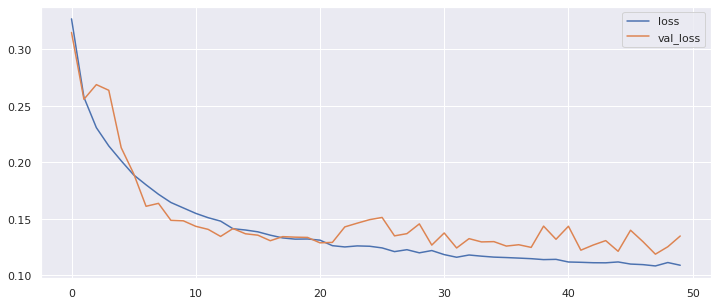

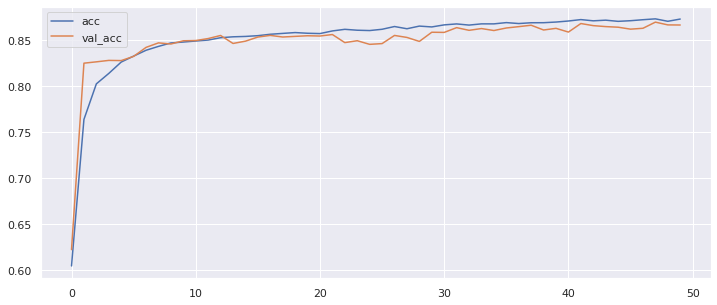

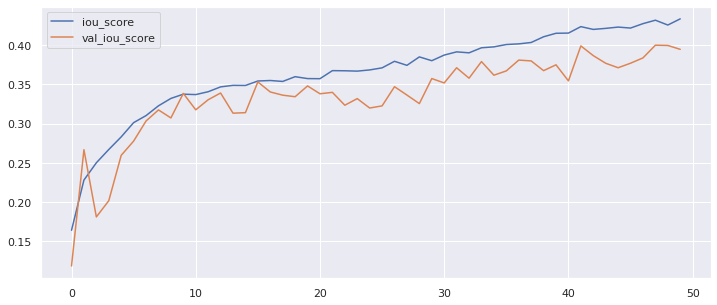

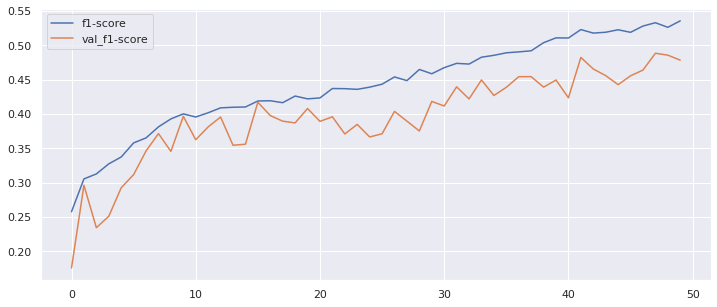

In [37]:
plot_history(history.history)

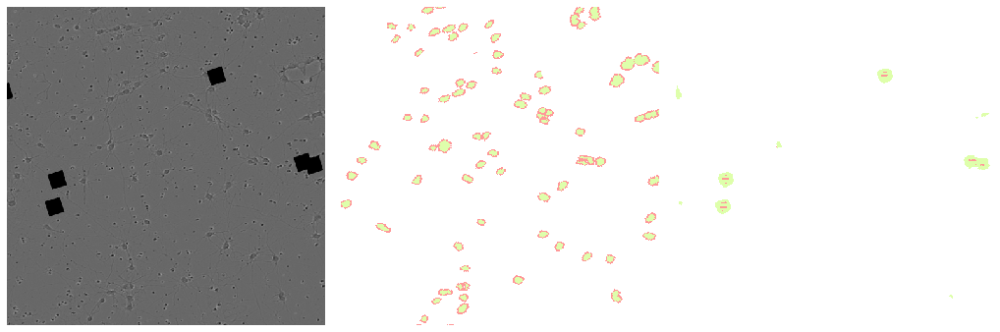

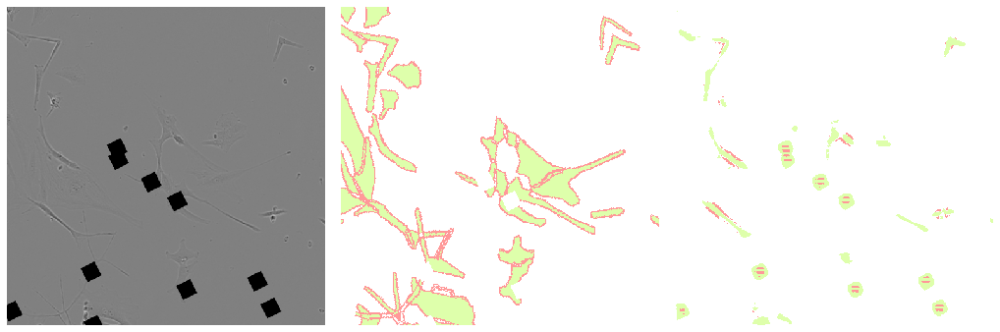

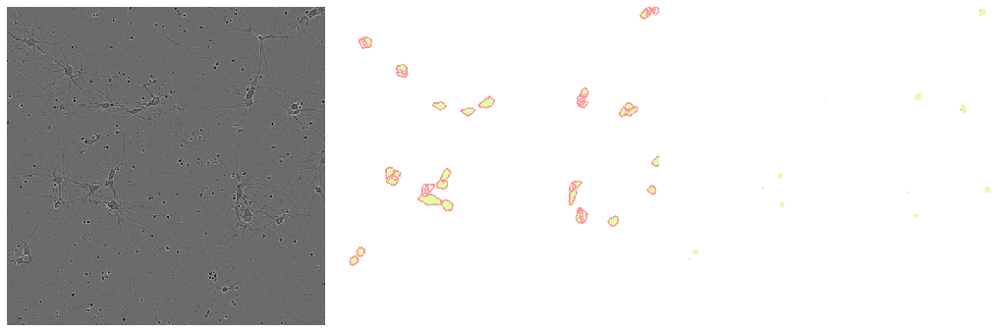

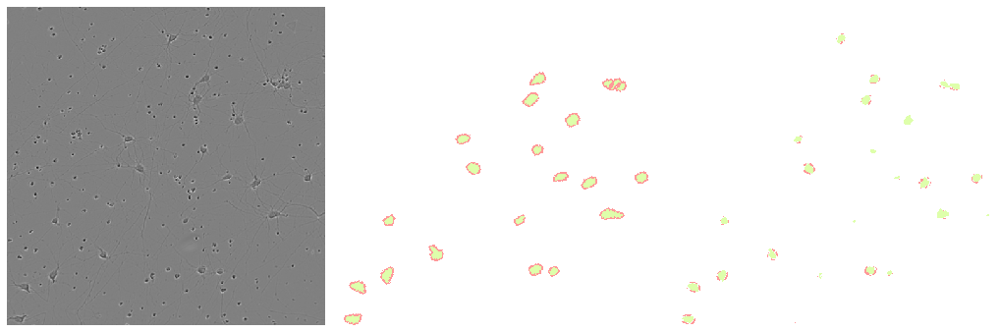

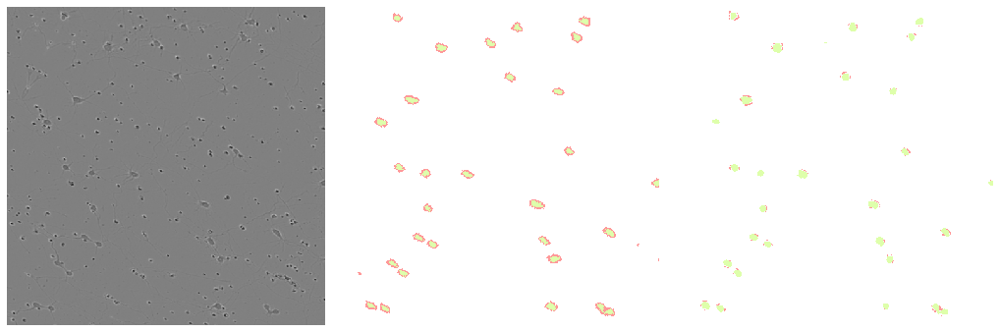

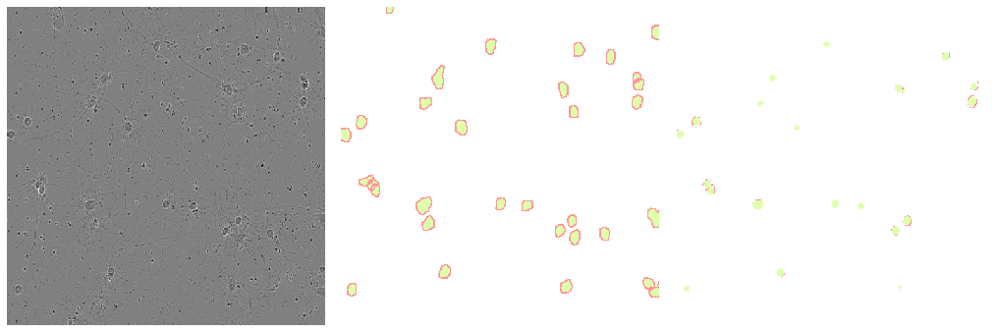

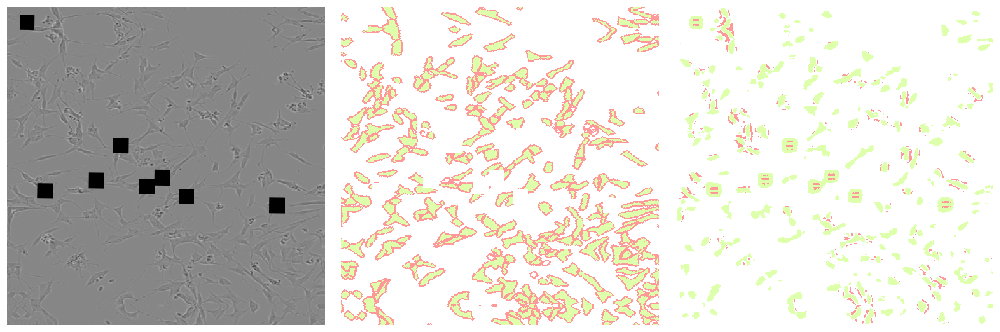

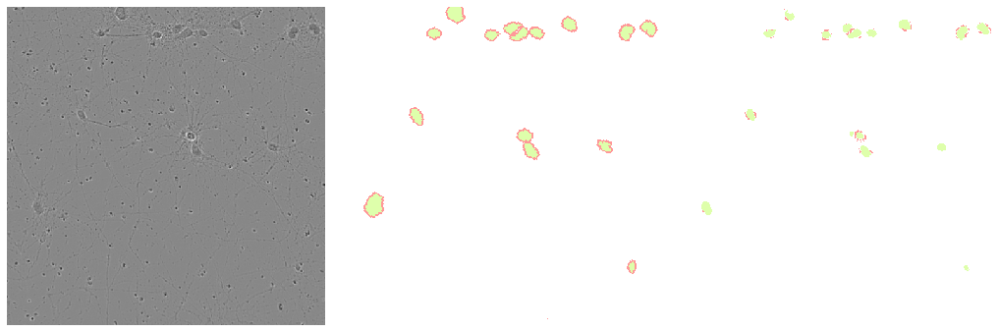

In [38]:
# show precictions on training set
train_images_sample, train_masks_sample = decode_tf_data(train_ds)
train_masks_pred = unet_model.predict(train_images_sample)

tf_plot_img_and_mask_and_prediction(train_images_sample, train_masks_sample, train_masks_pred)

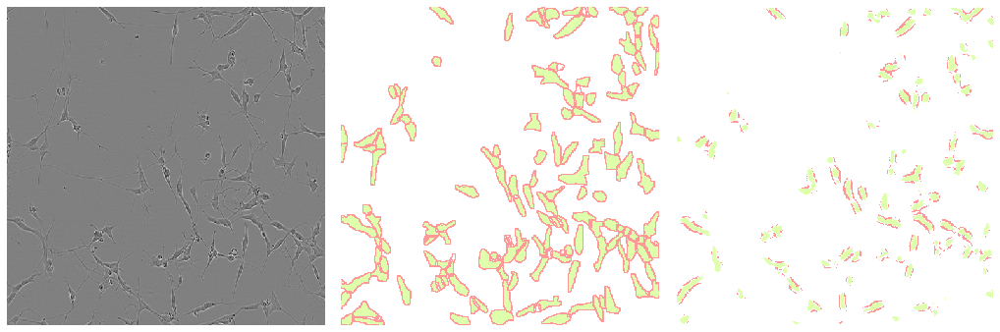

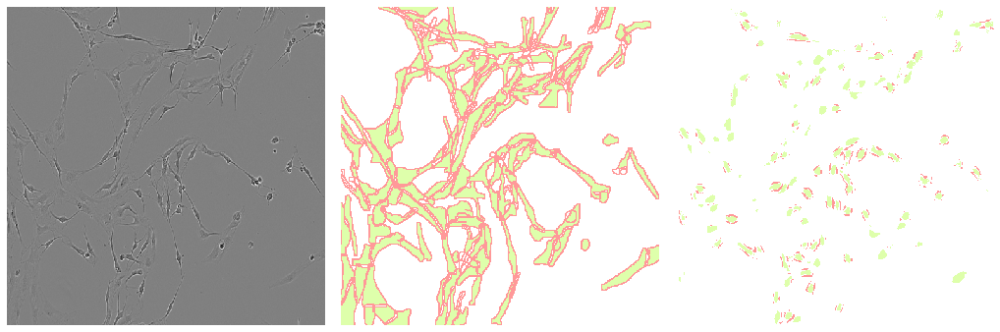

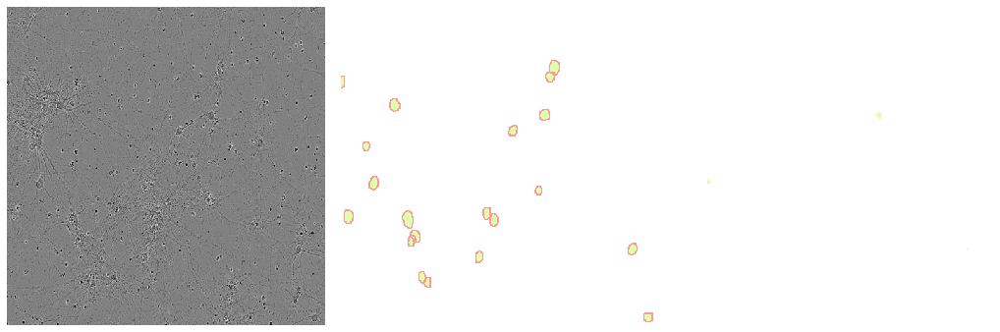

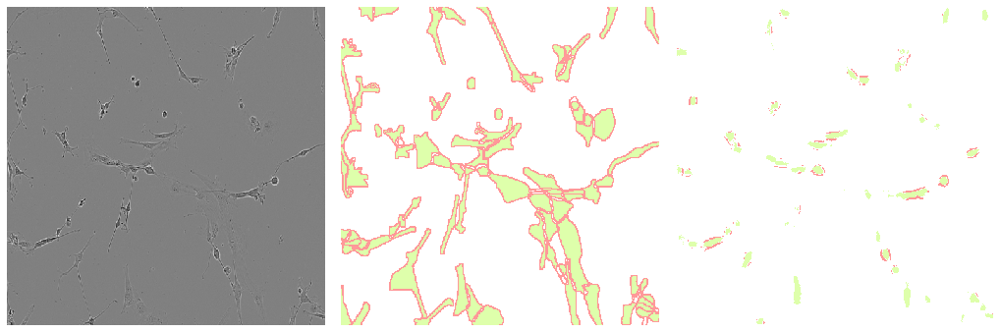

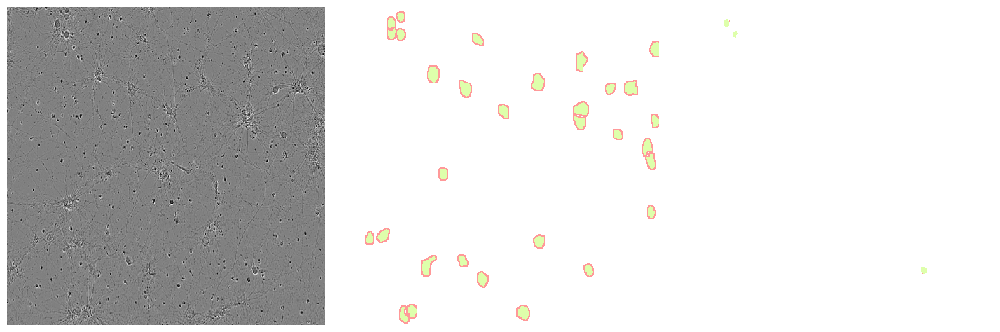

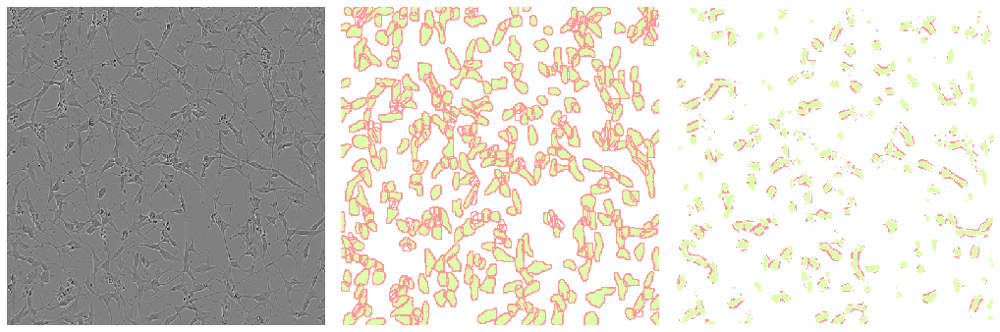

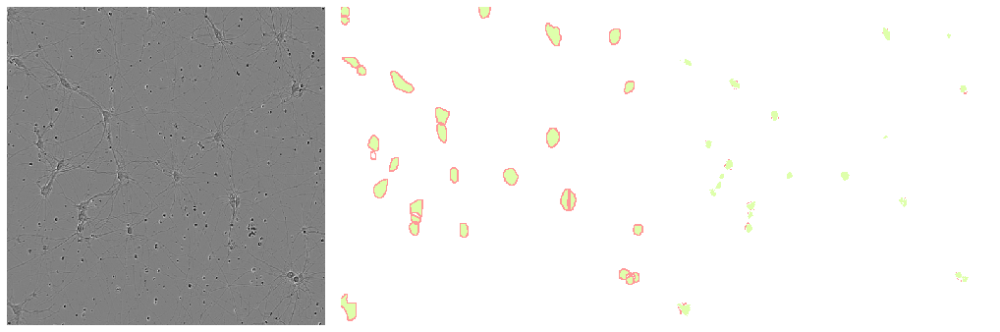

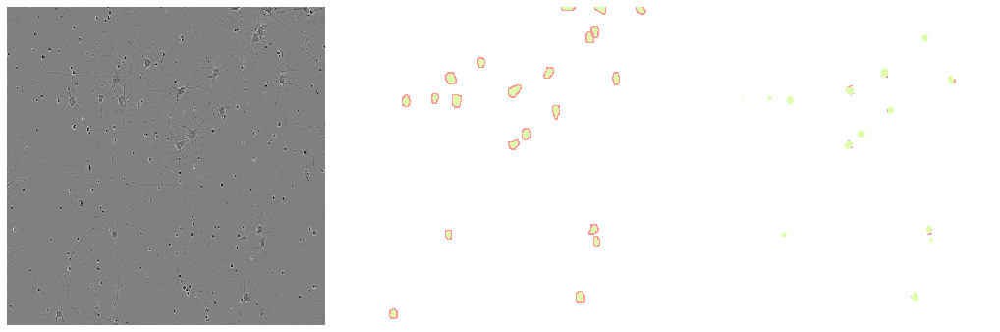

In [39]:
# show precictions on validation set
valid_images_sample, valid_masks_sample = decode_tf_data(valid_ds)
valid_masks_pred = unet_model.predict(valid_images_sample)

tf_plot_img_and_mask_and_prediction(valid_images_sample, valid_masks_sample, valid_masks_pred)

# Inferrence

In [40]:
TEST_IMG_DIR = os.path.join(BASE_DIR, 'test')

SUBMISSION_FILE = 'submission.csv'
SAMPLE_SUBMISSION_FILE = os.path.join(BASE_DIR, 'sample_submission.csv')

In [41]:
df_sub = pd.read_csv(SAMPLE_SUBMISSION_FILE)
df_sub.head()

,id,predicted
0,7ae19de7bc2a,NaN
1,d48ec7815252,NaN
2,d8bfd1dafdc4,NaN


In [42]:
# load test data

test_ids = df_sub['id'].unique().tolist()
X_test = np.zeros((len(test_ids), *INPUT_SHAPE))

for i, test_id in enumerate(test_ids):
    img = load_img(test_id, dir_=TEST_IMG_DIR)
    img = cv2.resize(img, INPUT_SHAPE[:2][::-1])
    X_test[i] = img
    
X_test.shape

(3, 512, 512, 3)

In [43]:
# predict on test data
test_pred = unet_model.predict(X_test)
test_pred.shape

(3, 512, 512, 3)

In [44]:
def split_segmented_instances(mask, min_size=100):
    num_component, component_mask = cv2.connectedComponents(mask.astype(np.uint8))
    
    preds = []
    for c_idx in range(1, num_component):
        c_mask = (component_mask == c_idx).astype(int)
        if c_mask.sum() > min_size:
            preds.append(c_mask)

    return preds

In [45]:
# create prediction dataframe
df_pred = pd.DataFrame(columns=df_sub.columns)

i = 0
for j, test_id in enumerate(test_ids):
    proba = cv2.resize(test_pred[j][..., 2], IMAGE_SHAPE[:2][::-1], interpolation=cv2.INTER_LINEAR)
    mask = cv2.threshold(proba, 0.5, 1, cv2.THRESH_BINARY)[1]
    
#     cell_mask = mask[..., 1]
#     cont_mask = mask[..., 0]
#     cell_mask[cont_mask == 1] = 0
    
    masks = split_segmented_instances(mask)
    rles = [rle_encode((mask == 1).astype(int)) for mask in masks]
    
    for rle in rles:
        df_pred.loc[i] = test_id, rle
        i += 1
        
df_pred

,id,predicted
0,7ae19de7bc2a,767 4 1467 8 2170 10 2873 11 3574 14 4277 15 4...
1,7ae19de7bc2a,2395 4 3097 8 3801 10 4505 11 5209 12 5914 12 ...
2,7ae19de7bc2a,4023 4 4724 8 5426 11 6130 12 6833 15 7537 15 ...
3,7ae19de7bc2a,3382 6 3389 1 3396 4 4085 3 4091 12 4774 12 47...
4,7ae19de7bc2a,12638 3 13342 4 14046 5 14748 8 15452 9 16155 ...
...,...,...
151,d8bfd1dafdc4,330722 1 331425 5 332129 6 332833 7 333537 7 3...
152,d8bfd1dafdc4,336567 13 337267 17 337968 20 338671 21 339375...
153,d8bfd1dafdc4,339511 7 340215 9 340918 11 341622 11 342326 1...
154,d8bfd1dafdc4,347294 5 347997 11 348700 14 349404 14 350108 ...


In [46]:
df_pred.to_csv(SUBMISSION_FILE, index=False)

There are 94 instances in 7ae19de7bc2a
There are 94 instances in 7ae19de7bc2a
There are 31 instances in d48ec7815252
There are 31 instances in d48ec7815252
There are 31 instances in d8bfd1dafdc4
There are 31 instances in d8bfd1dafdc4


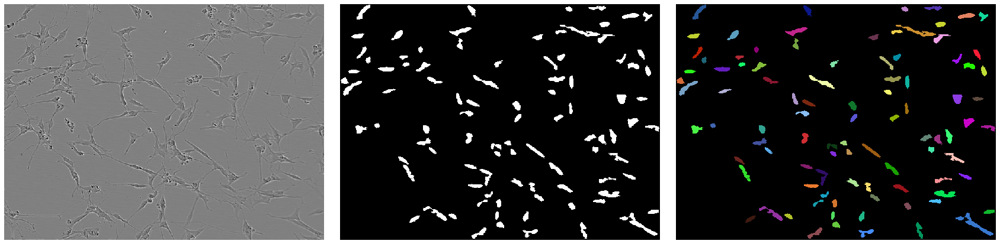

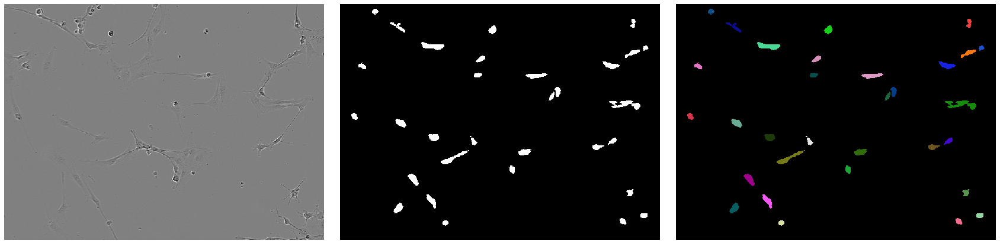

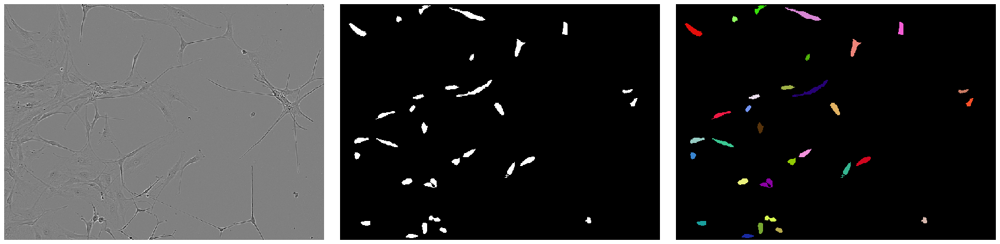

In [47]:
# visualize test data prediction

for test_id in test_ids:
    plot_img_and_mask(
        df_pred.rename(columns={'predicted': 'annotation'}), 
        test_id, 
        TEST_IMG_DIR
    )

In [48]:
# def read_image(path):
#     x = cv2.imread(path)
#     x = cv2.resize(x, (512, 512))
# #     x = np.expand_dims(x, axis=-1)
#     x = x.astype(np.double)
#     return x

# def read_mask(path):
#     x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
#     x = cv2.resize(x, (512, 512))
#     x = np.expand_dims(x, axis=-1)
#     x = x.astype(np.double)
#     return x

In [49]:
# def load_data(mask_path, split=0.1):
#     img_path = "../input/sartorius-cell-instance-segmentation/train"
#     images = [img_path + "/"+ i for i in sorted(os.listdir("../input/sartorious-dataset-preprocessed/masks/img"))]
#     masks = [mask_path + "/"+ i for i in sorted(os.listdir("../input/sartorious-dataset-preprocessed/masks/img"))]

#     train_x, valid_x = train_test_split(images, test_size=split, random_state=42)
#     train_y, valid_y = train_test_split(masks, test_size=split, random_state=42)


#     return (train_x, train_y), (valid_x, valid_y)

# mask_path = "../input/sartorious-dataset-preprocessed/masks/img"
# (train_x, train_y), (valid_x, valid_y) = load_data(mask_path)


# train_x = np.array(train_x)
# train_y = np.array(train_y)
# valid_x = np.array(valid_x)
# valid_y = np.array(valid_y)

In [50]:
# def post_process(probability, threshold=0.5, min_size=300):
#     mask = cv2.threshold(probability, threshold, 1, cv2.THRESH_BINARY)[1]
#     num_component, component = cv2.connectedComponents(mask.astype(np.uint8))
#     predictions = []
#     for c in range(1, num_component):
#         p = (component == c)
#         if p.sum() > min_size:
#             a_prediction = np.zeros((520, 704), np.float32)
#             a_prediction[p] = 1
#             predictions.append(a_prediction)
#     return predictions

In [51]:
# import cv2

# def tta_preds(image_dataset):
# #Now that we know the transformations are working, let us extend to all predictions
#     predictions = []
#     for image in image_dataset:
#         plt.figure(figsize=(20,20))
#         pred_original = unet_model.predict(np.expand_dims(image, axis=0))
#         plt.subplot(1,5,1)
#         plt.imshow(np.reshape(pred_original,(512,512)))
        
#         pred_lr = unet_model.predict(np.expand_dims(np.fliplr(image), axis=0))
#         pred_lr = np.fliplr(pred_lr.squeeze(0))
#         plt.subplot(1,5,2)
#         plt.imshow(np.reshape(pred_lr,(512,512)))

        
#         pred_ud = unet_model.predict(np.expand_dims(np.flipud(image), axis=0))
#         pred_ud = np.flipud(pred_ud.squeeze(0))
#         plt.subplot(1,5,3)
#         plt.imshow(np.reshape(pred_ud,(512,512)))
        
        
        
#         pred_lr_ud = unet_model.predict(np.expand_dims(np.fliplr(np.flipud(image)), axis=0))
#         pred_lr_ud = np.fliplr(np.flipud(pred_lr_ud).squeeze(0))
#         plt.subplot(1,5,4)
#         plt.imshow(np.reshape(pred_lr_ud,(512,512)))

        
        
#         preds = (pred_original + pred_lr + pred_ud + pred_lr_ud) / 4
# #         plt.subplot(1,5,4)
# #         plt.imshow(np.reshape(preds,(256,256)))
        
# #         break
#         predictions.append(preds)


#     predictions = np.array(predictions)

#     threshold = 0.5
#     predictions_th = predictions > threshold
    
#     return predictions_th

# test_dir = "../input/sartorius-cell-instance-segmentation/test"
# ids = sub_df["id"].tolist()

# sub_list = []
# sub_img = []
# for i in ids:
#     file_path = test_dir + "/" + i + ".png"
#     x = read_image(file_path)
#     sub_img.append(x)

# sub_preds = tta_preds(sub_img)


# for ide,j in enumerate(sub_preds):
# #     print(j.astype(np.float32).shape)
# #     break
#     y_pred = np.reshape(j.astype(np.uint16),(512,512))
# #     print(j.astype(np.float32).shape)

#     y_pred = cv2.resize(y_pred,(704,520),interpolation = cv2.INTER_AREA)
# #     print(y_pred.shape)
#     predictions = post_process(y_pred)
#     for k in predictions:
#         sub_list.append((ids[ide],rle_encode(k)))

In [52]:
# def load_image_and_label_from_path(image_path, mask_path):
#     img = tf.io.read_file(image_path)
#     img = tf.image.decode_png(img, channels=3)
#     img = tf.image.resize(img, (512, 512))
    
#     mask = tf.io.read_file(mask_path)
#     mask = tf.image.decode_png(mask, channels=1)
#     mask = tf.image.resize(mask, (512, 512))
#     return img, mask


# training_data = tf.data.Dataset.from_tensor_slices((train_x, train_y))
# validation_data = tf.data.Dataset.from_tensor_slices((valid_x, valid_y))

# training_data = training_data.map(load_image_and_label_from_path, num_parallel_calls=AUTOTUNE).batch(8)
# validation_data = validation_data.map(load_image_and_label_from_path, num_parallel_calls=AUTOTUNE).batch(8)

In [53]:
# sub = pd.DataFrame(sub_list,columns=['id','predicted'])
# sub.head()

In [54]:
# sub.to_csv("submission.csv",index=False)

In [55]:
# SEG_DIR = "/kaggle/input/sartorius-segmentation-train-mask-dataset-npz"


# # Aggregate under training 
# df_train["img_path"] = df_train["id"].apply(lambda x: os.path.join(TRAIN_IMG_DIR, x+".png")) # Capture Image Path As Well
# df_tmp = df_train.drop_duplicates(subset=["id", "img_path"]).reset_index(drop=True)
# df_train["annotation"] = df_train.groupby("id")["annotation"].agg(list).reset_index(drop=True)
# df_train["seg_path"] = df_train.id.apply(lambda x: os.path.join(SEG_DIR, f"{x}.npz"))
# df_train

In [56]:
# import pandas as pd
# import numpy as np
# from tqdm import tqdm

# df = pd.DataFrame(np.random.randint(0, 100, (10000000, 10)))

# # Register `pandas.progress_apply` and `pandas.Series.map_apply` with `tqdm`
# # (can use `tqdm_gui`, `tqdm_notebook`, optional kwargs, etc.)
# tqdm.pandas(desc="my bar!")

# # Now you can use `progress_apply` instead of `apply`
# # and `progress_map` instead of `map`
# df.progress_apply(lambda x: x**2)

In [57]:
# %%time
# images = df_train['id'].map(lambda x: os.path.join(TRAIN_IMG_DIR, x))
# masks = df_train['annotation'].map(rle_decode)
# df_train.shape

In [58]:
# print(f"\n... ACCELERATOR SETUP STARTING ...\n")

# # Detect hardware, return appropriate distribution strategy
# try:
#     # TPU detection. No parameters necessary if TPU_NAME environment variable is set. On Kaggle this is always the case.
#     TPU = tf.distribute.cluster_resolver.TPUClusterResolver()  
# except ValueError:
#     TPU = None

# if TPU:
#     print(f"\n... RUNNING ON TPU - {TPU.master()}...")
#     tf.config.experimental_connect_to_cluster(TPU)
#     tf.tpu.experimental.initialize_tpu_system(TPU)
#     strategy = tf.distribute.experimental.TPUStrategy(TPU)
# else:
#     print(f"\n... RUNNING ON CPU/GPU ...")
#     # Yield the default distribution strategy in Tensorflow
#     #   --> Works on CPU and single GPU.
#     strategy = tf.distribute.get_strategy() 

# # What Is a Replica?
# #    --> A single Cloud TPU device consists of FOUR chips, each of which has TWO TPU cores. 
# #    --> Therefore, for efficient utilization of Cloud TPU, a program should make use of each of the EIGHT (4x2) cores. 
# #    --> Each replica is essentially a copy of the training graph that is run on each core and 
# #        trains a mini-batch containing 1/8th of the overall batch size
# N_REPLICAS = strategy.num_replicas_in_sync
    
# print(f"... # OF REPLICAS: {N_REPLICAS} ...\n")

# print(f"\n... ACCELERATOR SETUP COMPLTED ...\n")